In [5]:
%%HTML
<style>
.container{width:75% !important;}
.text_cell_rendered_html{width:20% !important;}
</style>

# Datashader: Plotting big data made easy

Datashader is a graphics pipeline system for creating meaningful representations of large datasets.

![census](images/Pipeline.png)

- **Projection**: Creates a 2D grid of bins on which the data will be projected.
- **Aggregation**: The input data is processed and aggregated into the target bins.
- **Transformation**: An image is created from the former aggregated data.

![census](images/usa_census.jpg)

You can check all the [datashader examples](https://github.com/bokeh/datashader/tree/master/examples) available in the repository

In [10]:
from bokeh.models import HoverTool
from bokeh.plotting import figure, output_notebook
from bokeh.tile_providers import WMTSTileSource
import datashader as ds
import datashader.transfer_functions as tf
from datashader.bokeh_ext import InteractiveImage
from datashader.colors import inferno,Hot
from cartopy import crs
from IPython.core.display import clear_output
import warnings
warnings.filterwarnings("ignore")
output_notebook()

Loading BokehJS ...

In [3]:
import numpy as np
import pandas as pd
date_cols = ['last_scraped','host_since','last_review',
             'first_review','calendar_last_scraped']
listings = pd.read_csv('data/listings_clean.csv',
                       index_col='Unnamed: 0',
                       parse_dates=date_cols).dropna(how='all',axis=1)

## Plotting pipeline

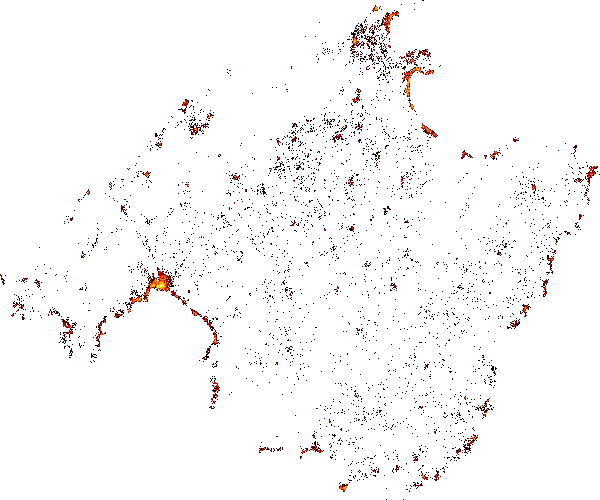

In [16]:

cvs = ds.Canvas(plot_width=600, plot_height=500)
agg = cvs.points(listings, 'longitude', 'latitude', ds.count())#ds.mean('price'))
img = tf.shade(agg, cmap=Hot, how='log')
img

In [18]:
from holoviews.operation.datashader import aggregate, shade, datashade, dynspread
import holoviews as hv
hv.notebook_extension('bokeh',width=60)

## Comparing a regular scatter plot vs datashader

In [34]:
%%output size=180
%%opts Points [xaxis=None yaxis=None tools=['hover'] width=280 height=300 alpha=0.8] RGB [xaxis=None yaxis=None]

scatter = hv.Points((listings['longitude'], listings['latitude']), label="Mallorca listings")
dsimage = dynspread(datashade(scatter), dynamic=True)
dsimage+scatter

:Layout
   .DynamicMap.I             :DynamicMap   []
      :RGB   [x,y]   (R,G,B,A)
   .Points.Mallorca_listings :Points   [x,y]

## Overlaying data on maps

In order to overlay datashader images on top of a map we must follow the following steps:
1. **Transform the data coordinates to a suitable projection**
2. **Create a bokeh plot cointaining the data points**
3. **Create a map image from an ArcGIS tile source**
4. **Define a callback function that outputs a datashader image**

### 1. Transforming the coordinates

The tiles from OSM use the GOOGLE_MRCATOR projection instead of the PlateCarree projection, so we must transform the data before plotting it.

In [35]:
def transform_coords(df):
    df = df.copy()
    lons = np.array(df['longitude'])
    lats = np.array(df['latitude'])
    coords = crs.GOOGLE_MERCATOR.transform_points(crs.PlateCarree(), lons, lats)
    df['longitude'] = coords[:, 0]
    df['latitude']  = coords[:, 1]
    return df

### 2. Creating the plot that will contain the data

In [36]:
plot_width  = 1200
plot_height = 800
x_range = (2.845e5, 3.65e5)
y_range = (47.99e5, 48e5)


def base_plot(tools='pan,wheel_zoom,reset,resize',plot_width=plot_width, plot_height=plot_height,**plot_args):
    hover = HoverTool(
        tooltips=[
            ("index", "$index"),
            ("(lat,lon)", "($x, $y)"),
            ("price", "@price"),
        ]
    )
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
        x_range=x_range, y_range=y_range, outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0, **plot_args)
    
    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    return p

### 3. Loading an OSM tile source

This is easy, just write this two lines and let datashader take care of everything else

In [37]:
ArcGIS=WMTSTileSource(url='http://server.arcgisonline.com/ArcGIS/rest/services/'
                      'World_Street_Map/MapServer/tile/{Z}/{Y}/{X}.png')

### 4. Defining the image callback for the dynamic datashader image

Note that the actual data is defined outside the callback, so all the parameters in the function refer to display options

In [38]:

def create_image(x_range=x_range, y_range=y_range, w=plot_width, h=plot_height, 
                 aggregator=ds.count(), black=False):
    opts={}
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    
    agg = cvs.points(l2, 'longitude', 'latitude',  aggregator)
    img = tf.shade(agg, cmap=inferno, **opts)
        
    if black: img = tf.set_background(img, 'black')
    
    return tf.dynspread(img, threshold=0.70,max_px=3)

l2 = transform_coords(listings.copy())
p = base_plot()
p.add_tile(ArcGIS)
InteractiveImage(p, create_image)

## Playing with the datashader API

In [39]:
from shaolin import Dashboard
from shaolin.dashboards.colormap import ColormapPicker
from IPython.core.display import clear_output, display
plot_width  = 800
plot_height = 600
x_range = (2.845e5, 3.65e5)
y_range = (47.99e5, 48e5)
class Datashader(Dashboard):
    
    def __init__(self, df,
                 gliph='point',
                 agg='count', 
                 mode='interactive',
                 x_col='longitude',
                 y_col='latitude',
                 threshold=0.5,
                 max_px=3,
                 width_scale=1.,
                 height_scale=1.,
                 x_range = (2.845e5, 3.65e5),
                 y_range = (47.99e5, 48e5),
                 plot_width  = 1200,
                 plot_height = 800,
                 **kwargs ):
        
        self.df = df
        self._aggs = {'count':ds.reductions.count,
                      'any':ds.reductions.any,
                      'sum':ds.reductions.sum,
                      'min':ds.reductions.min,
                      'max':ds.reductions.max,
                      'mean':ds.reductions.mean,
                      'var':ds.reductions.var,
                      'std':ds.reductions.std,
                      'count_cat':ds.reductions.count_cat                      
                     }
        self.columns = df.columns.tolist()+['None']
        reductions = ['c$N=reductions',['@dd$d=Reduction type',
                                        '@dd$d=Column&n=reduction_col&val=None&o='+str(self.columns),
                                        ColormapPicker(name='cmap',mode='interactive')
                                       ]
                     ]
        canvas = ['c$N=canvas_opts',['@rad$d=Gliph type&o=["Point","Line"]',
                                     '@dd$d=X column&o='+str(self.columns)+'&val='+str(x_col),
                                     '@dd$d=Y column&o='+str(self.columns)+'&val='+str(y_col),
                                     '@(0.,1.,0.05,{})$d=threshold'.format(threshold),
                                     '@(1,500,1,{})$d=Max px'.format(max_px),
                                     '@cpicker$d=Background color&val=white'
                                    ]
                 ]
        dash = ["t$N=datashader&t=Canvas,Reductions,Diverging, Colorbrewer,",[canvas,reductions]]
        
        Dashboard.__init__(self,dash,**kwargs)
        self.reduction_type.options = self._aggs
        self.reduction_type.value = ds.reductions.count
        self.observe(self.update)
        self.cmap.close_btn.observe(self.update)
        self.create_plot()
        #self.update()
    
    def base_plot(self,
                  tools='pan,wheel_zoom,reset,resize',
                  plot_width=plot_width, plot_height=plot_height,**plot_args):
        
        p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
            x_range=x_range, y_range=y_range, outline_line_color=None,
            min_border=0, min_border_left=0, min_border_right=0,
            min_border_top=0, min_border_bottom=0, **plot_args)

        p.axis.visible = False
        p.xgrid.grid_line_color = None
        p.ygrid.grid_line_color = None

        return p
    
    #@staticmethod
    def create_image(self,x_range=(2.845e5, 3.65e5), y_range=(47.99e5, 48e5), w=800, h=600, 
                  categorical=None, black=False, cmap=None):
        
        opts={}
        if categorical and cmap:
            opts['color_key'] = categorical_color_key(len(flightpaths[aggregator.column].unique()),cmap)       

        cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
        if self.reduction_type.value==ds.reductions.count_cat:
            col = self.reduction_col.value if self.reduction_col.value!='None' else 'room_type'
            self.df['_category_plot'] = self.df[col].astype("category")
            agg = cvs.points(transform_coords(self.df),
                             self.x_column.value,
                             self.y_column.value,
                             self.reduction_type.value('_category_plot'))
        elif self.reduction_col.value=='None':
            agg = cvs.points(transform_coords(self.df),
                             self.x_column.value,
                             self.y_column.value,
                             self.reduction_type.value())
        
        else: 
            agg = cvs.points(transform_coords(self.df),
                             self.x_column.value,
                             self.y_column.value,
                             self.reduction_type.value(self.reduction_col.value))
            
        img = tf.shade(agg, cmap=self.cmap.cmap, **opts)
        #print(self.cmap.map_data(np.arange(4),hex=True))
        #img = tf.set_background(img, self.background_color.value)
        return  tf.dynspread(img, threshold=self.threshold.value,max_px=self.max_px.value)

    def create_plot(self):
        clear_output(True)
        self.p = self.base_plot()
        self.p.add_tile(ArcGIS)
        self.image = InteractiveImage(self.p, self.create_image)
        return display(self.image)
    
    def update(self,_=None):
        try:
            self.create_plot()
            #self.image.renderer.data_source.data.image =  self.image.callback().data
        except:
            raise

In [40]:
dsp = Datashader(df=listings.copy())
dsp[0]